In [1]:
import torch as torch
import cv2
import numpy as np
import matplotlib.cm as cm
# from kornia import make_matching_figure
import glob
import matplotlib.pyplot as plt


In [2]:

imagePaths = glob.glob(f'./sunMountain/*.jpg')
print(imagePaths)

['./sunMountain/1.jpg', './sunMountain/2.jpg', './sunMountain/3.jpg']


In [3]:
from featureMatcher import matchFeaturesLOFTR

img0_raw = cv2.cvtColor(cv2.imread(imagePaths[2], cv2.IMREAD_COLOR  ) , cv2.COLOR_BGR2RGB)
img1_raw = cv2.cvtColor(cv2.imread(imagePaths[1], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
img2_raw = cv2.cvtColor(cv2.imread(imagePaths[0], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)

kpts1, kpts2, confidences = matchFeaturesLOFTR(img0_raw, img1_raw, pretrainedName='outdoor')


img1 to grayscale
img2 to grayscale
(640, 360) (3840, 2160)
dict_keys(['keypoints0', 'keypoints1', 'confidence', 'batch_indexes'])


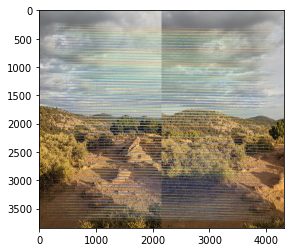

In [4]:
from featureMatcher import drawMatches

imgMatch = drawMatches(img0_raw, img1_raw,kpts1, kpts2, confidences)
plt.imshow(imgMatch)


inliers:  1761  /  1761
(3840, 2160, 3)
(3840, 2160, 3)


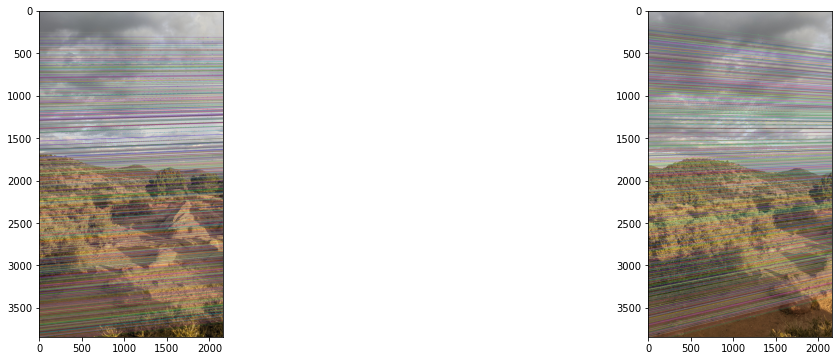

In [5]:
from fundamentalMatrix import ransac_fundamental_matrix, homogenizePoints
from fundamentalMatrix import estimate_normalized_8_point_fundamental_matrix
from fundamentalMatrix import drawLines,homogenizePoints

# Fgpt = estimate_normalized_8_point_fundamental_matrix(mkpts0, mkpts1)
# print('Fgpt:', Fgpt)

Fgpt, mask = ransac_fundamental_matrix(kpts1, kpts2, 0.1, 3000, estimate_normalized_8_point_fundamental_matrix)
pts03 = homogenizePoints(kpts1[mask])
pts13 = homogenizePoints(kpts2[mask])
lines1pt = (Fgpt @ pts03.T).T
lines0pt = (Fgpt.T @ pts13.T).T

# draw the epipolar lines
img1WEpilines = drawLines(img0_raw, lines1pt, pts13)
fig, axes = plt.subplots(1, 2, figsize=(20, 6))
axes[0].imshow(img1WEpilines,cmap='gray')
img0WEpilines = drawLines(img1_raw, lines0pt, pts03)
axes[1].imshow(img0WEpilines,cmap='gray')
plt.show()

In [6]:
# image rectification

def skewSymmetric(v):
    return np.array([[0, -v[2], v[1]],
                     [v[2], 0, -v[0]],
                     [-v[1], v[0], 0]])

def findEpipole(F):
    U, S, Vt = np.linalg.svd(F)
    e = Vt[-1]
    return e / e[2]
    
# below is from Image Rectification at https://web.stanford.edu/class/cs231a/course_notes/03-epipolar-geometry_2022.pdf
#
# The H1 finding section seems to work, but I could not get the H2 section to work, so I wrote what I thought would work.
def findHomography(F, imgShape, inliers1, inliers2):
    epipole2 = findEpipole(F.T)
    T2 = np.eye(3)
    T2[0, 2] = -imgShape[1] / 2.0
    T2[1, 2] = -imgShape[0] / 2.0

    G2 = np.eye(3)
    G2[2, 0] = -1.0 / 10000
 
    alpha2 = -1 
    if epipole2[0] > 0 :
        alpha2 = 1
    denom = np.sqrt(epipole2[0]**2 + epipole2[1]**2)
    R2 = np.eye(3)
    R2[0, 0] = alpha2 * epipole2[0] / denom
    R2[0, 1] = alpha2 * epipole2[1] / denom
    R2[1, 0] = -alpha2 * epipole2[1] / denom
    R2[1, 1] = alpha2 * epipole2[0] / denom

    H2 = np.linalg.inv(T2) @ G2 @ R2 @ T2
    print('H2', H2)

    # H1 
    epipole1 = findEpipole(F)
    T1 = np.eye(3)
    T1[0, 2] = -imgShape[1] / 2.0
    T1[1, 2] = -imgShape[0] / 2.0

    G1 = np.eye(3)
    G1[2, 0] = -1.0 / 10000

    alpha1 = -1
    if epipole1[0] > 0:
        alpha1 = 1
    denom = np.sqrt(epipole1[0]**2 + epipole1[1]**2)
    R1 = np.eye(3)
    R1[0, 0] = alpha1 * epipole1[0] / denom
    R1[0, 1] = alpha1 * epipole1[1] / denom
    R1[1, 0] = -alpha1 * epipole1[1] / denom
    R1[1, 1] = alpha1 * epipole1[0] / denom

    H1_pre = np.linalg.inv(T1) @ G1 @ R1 @ T1
    # now fit points so that you minimize a in [ a @ H1_pre @ inliers1 - H2 @ inliers2 ]^2
    inliers1_hom = H1_pre @ inliers1.T
    inliers2_hom = H2 @ inliers2.T
    phat = inliers1_hom.T
    phat_prime = inliers2_hom.T#[:,0:2]
    a = np.linalg.lstsq(phat, phat_prime, rcond=None)[0]

    H1 = a.T @ H1_pre 

    return H1, H2

H2 [[ 8.91912710e-01  1.24786729e-02  9.27752210e+01]
 [-2.05970755e-01  9.97216149e-01  2.27793409e+02]
 [-9.99902142e-05 -1.39895436e-06  1.11067542e+00]]
H1 [[ 8.92418565e-01  3.25695264e-02  6.24381780e+02]
 [-2.01627135e-01  9.88995830e-01  1.56832771e+02]
 [-1.00046924e-04 -3.65129220e-06  1.05107828e+00]]


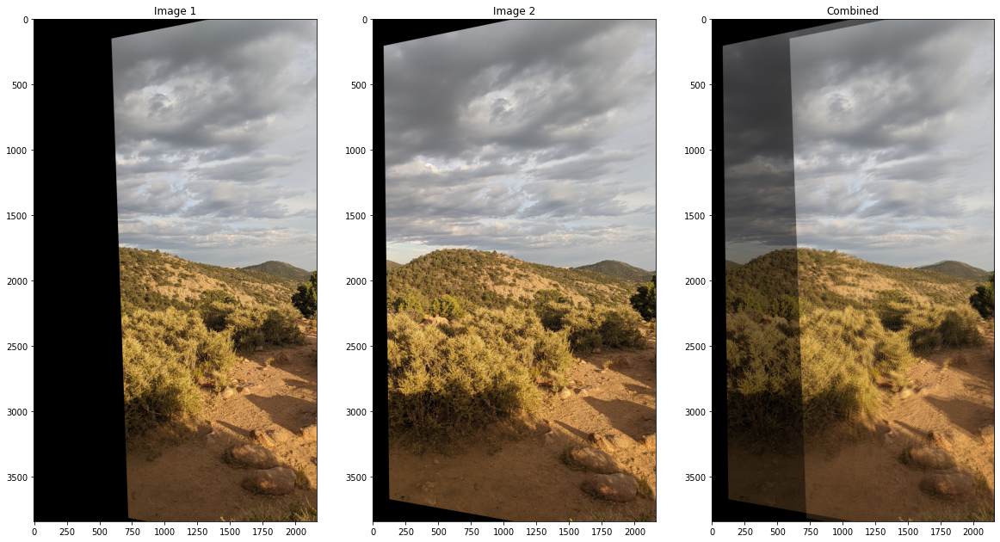

In [7]:
H1, H2 = findHomography(Fgpt, img0_raw.shape, pts03, pts13)

print('H1', H1)

# warp image
img0_warped = cv2.warpPerspective(img0_raw, H1, (img0_raw.shape[1], img0_raw.shape[0]))
img1_warped = cv2.warpPerspective(img1_raw, H2, (img0_raw.shape[1], img0_raw.shape[0]))
imgs_combined = (0.5 * img0_warped + 0.5 * img1_warped)/255.0

fig, (ax1,ax2, ax3) = plt.subplots(nrows=1,ncols=3,figsize=(20,20))

ax1.imshow(img0_warped)
ax1.set_title("Image 1")
ax2.imshow(img1_warped)
ax2.set_title("Image 2")
ax3.imshow(imgs_combined)
ax3.set_title("Combined")

plt.show()

# Try to do three images

In [8]:
# try with 3 images
k0_1_1 , k_0_1_2, c_0_1 = matchFeaturesLOFTR(img0_raw, img1_raw)
k1_2_1 , k_1_2_2, c_1_2 = matchFeaturesLOFTR(img1_raw, img2_raw)

F_0_1, mask_0_1 = ransac_fundamental_matrix(k0_1_1, k_0_1_2, threshold = 0.5, iterations = 2000, F_function = estimate_normalized_8_point_fundamental_matrix)
F_1_2, mask_1_2 = ransac_fundamental_matrix(k1_2_1, k_1_2_2, threshold = 0.5, iterations = 2000, F_function = estimate_normalized_8_point_fundamental_matrix)

pts0_1_1 = homogenizePoints(k0_1_1[mask_0_1])
pts0_1_2 = homogenizePoints(k_0_1_2[mask_0_1])
pts1_2_1 = homogenizePoints(k1_2_1[mask_1_2])
pts1_2_2 = homogenizePoints(k_1_2_2[mask_1_2])

H0_1_1, H0_1_2 = findHomography(F_0_1, img0_raw.shape, pts0_1_1, pts0_1_2)
H1_2_1, H1_2_2 = findHomography(F_1_2, img0_raw.shape, (H0_1_2 @ pts1_2_1.T).T, pts1_2_2)


img1 to grayscale
img2 to grayscale
(640, 360) (3840, 2160)
dict_keys(['keypoints0', 'keypoints1', 'confidence', 'batch_indexes'])
img1 to grayscale
img2 to grayscale
(640, 360) (3840, 2160)
dict_keys(['keypoints0', 'keypoints1', 'confidence', 'batch_indexes'])
inliers:  1761  /  1761
inliers:  1427  /  1427
H2 [[ 8.89899613e-01  6.11774369e-02  1.44773920e+00]
 [-2.60132469e-01  9.84477069e-01  3.10747095e+02]
 [-9.97645306e-05 -6.85845705e-06  1.12091393e+00]]
H2 [[ 8.71737053e-01  1.89046320e-01 -2.24444950e+02]
 [-3.99573805e-01  9.36592107e-01  5.53282864e+02]
 [-9.77283691e-05 -2.11935336e-05  1.14623822e+00]]


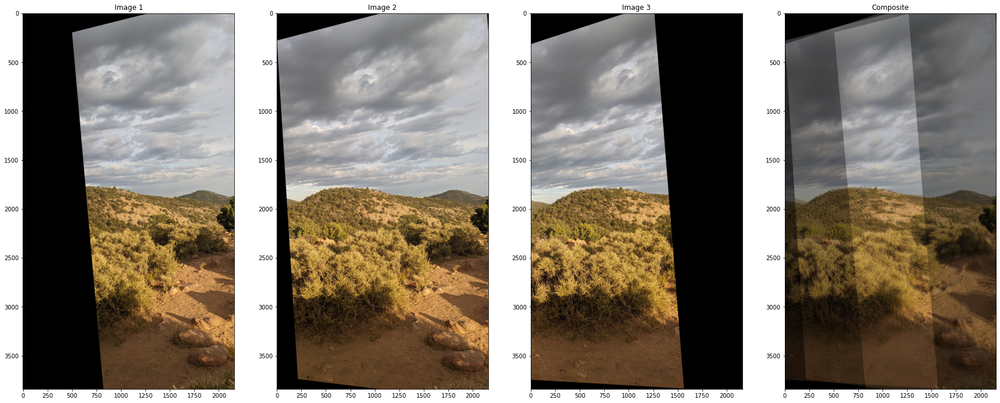

In [9]:
im0_warped = cv2.warpPerspective(
    img0_raw, H0_1_1, (img0_raw.shape[1], img0_raw.shape[0])
)
im1_warped = cv2.warpPerspective(
    img1_raw, H0_1_2, (img0_raw.shape[1], img0_raw.shape[0])
)
im2_warped = cv2.warpPerspective(
    img2_raw, np.linalg.inv(H1_2_1) @ H1_2_2, (img0_raw.shape[1], img0_raw.shape[0])
)

img_composite = (0.3 * im0_warped + 0.3 * im1_warped + +0.3 * im2_warped) / 255.0

fig, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=4, figsize=(30, 30))
ax1.imshow(im0_warped)
ax1.set_title("Image 1")
ax2.imshow(im1_warped)
ax2.set_title("Image 2")
ax3.imshow(im2_warped)
ax3.set_title("Image 3")
ax4.imshow(img_composite)
ax4.set_title("Composite")

plt.show()

(4500, 4500, 3)


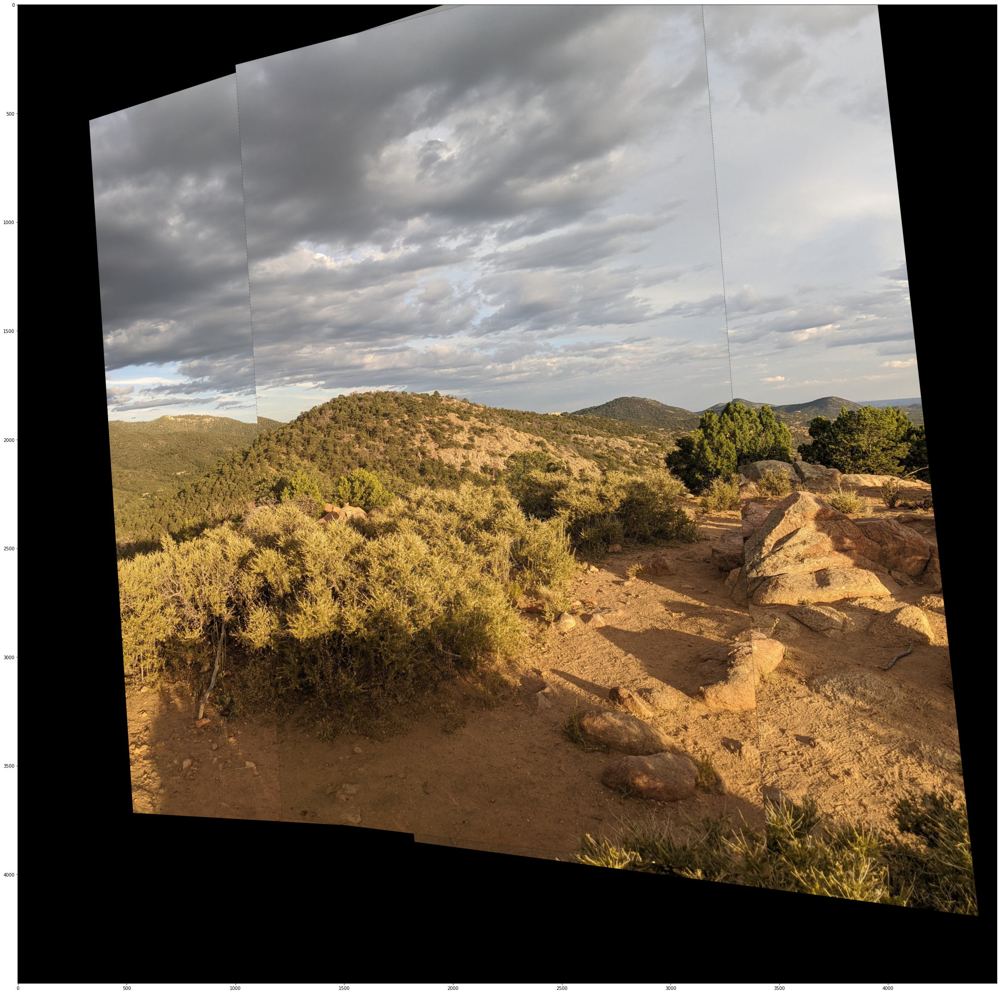

In [10]:
# blending
newShape = (4500, 4500)
T_shift_right = np.eye(3)
T_shift_right[0,2] = 1000


im0_warped = cv2.warpPerspective(
    img0_raw, T_shift_right @ H0_1_1, newShape
)
im1_warped = cv2.warpPerspective(
    img1_raw, T_shift_right @ H0_1_2, newShape
)
im2_warped = cv2.warpPerspective(
    img2_raw, T_shift_right @ np.linalg.inv(H1_2_1) @ H1_2_2, newShape
)


img0_msk = np.all(im0_warped[:,:,:] != [0,0,0], axis=-1)
img1_msk = np.all(im1_warped[:,:,:] != [0,0,0], axis=-1)
img2_msk = np.all(im2_warped[:,:,:] != [0,0,0], axis=-1)
mask_sum = 1.0*img0_msk + 1*img1_msk + 1*img2_msk + 1.0

img_warped_composite2 = im1_warped * img1_msk[:,:,None] + im2_warped * np.logical_not(img1_msk[:,:,None]) + im0_warped * np.logical_not(img1_msk[:,:,None]) 
print(img_warped_composite2.shape)

ig, ax1= plt.subplots(nrows=1, ncols=1, figsize=(40, 40))
ax1.imshow(img_warped_composite2)

img1 to grayscale
img2 to grayscale
(640, 360) (3840, 2160)
dict_keys(['keypoints0', 'keypoints1', 'confidence', 'batch_indexes'])


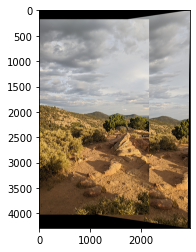

In [11]:
# try openCV homography

def warpTwoImages(img1, img2, H):
    '''warp img2 to img1 with homograph H'''
    h1,w1 = img1.shape[:2]
    h2,w2 = img2.shape[:2]
    pts1 = np.float32([[0,0],[0,h1],[w1,h1],[w1,0]]).reshape(-1,1,2)
    pts2 = np.float32([[0,0],[0,h2],[w2,h2],[w2,0]]).reshape(-1,1,2)
    pts2_ = cv2.perspectiveTransform(pts2, H)
    pts = np.concatenate((pts1, pts2_), axis=0)
    [xmin, ymin] = np.int32(pts.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(pts.max(axis=0).ravel() + 0.5)
    t = [-xmin,-ymin]
    Ht = np.array([[1,0,t[0]],[0,1,t[1]],[0,0,1]]) # translate

    result = cv2.warpPerspective(img2, Ht.dot(H), (xmax-xmin, ymax-ymin))
    result[t[1]:h1+t[1],t[0]:w1+t[0]] = img1
    return result


img0_raw = cv2.cvtColor(cv2.imread(imagePaths[2], cv2.IMREAD_COLOR  ) , cv2.COLOR_BGR2RGB)
img1_raw = cv2.cvtColor(cv2.imread(imagePaths[1], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
k0_1_1 , k_0_1_2, c_0_1 = matchFeaturesLOFTR(img0_raw, img1_raw)

M, mask = cv2.findHomography(k0_1_1, k_0_1_2, cv2.RANSAC, 5.0)

result = warpTwoImages(img0_raw, img1_raw, M)
plt.imshow(result)